<table border=0 width="100%"><tr><td><p align="left"><img src="..\img\logo.png" align="left" width=300></p></td><td><font size=3><B>应用机器学习模型做股价波动预测（郑海超）</B></font></td></tr></table>

# 内容
- 量化交易基础
- 预测任务
- 机器学习
- KNN分类模型
- 应用KNN模型做股价波动预测

# 量化交易基础
- 双均线参数评估
- 美股标普500策略评估
- 日历交易策略

## 导入评估函数

In [1]:
from helper_function import strategy_evaluate,calculate_log_returns

## 双均线参数评估

In [2]:
from helper_function import moving_average_strategy

In [3]:
import pandas as pd
sse_index = pd.read_csv("sse_daily_index.csv", index_col='trade_date', parse_dates=['trade_date'])
sse_index.sort_index(inplace = True)

In [4]:
sse_index.head()

,Unnamed: 0,ts_code,close,open,high,low,pre_close,change,pct_chg,vol,amount
trade_date,,,,,,,,,,,
2000-01-04,6284,000001.SH,1406.371,1368.693,1407.518,1361.214,1366.580,39.791,2.9117,9034023.0,5.183898e+06
2000-01-05,6283,000001.SH,1409.682,1407.829,1433.780,1398.323,1406.371,3.311,0.2354,10579984.0,8.137326e+06
2000-01-06,6282,000001.SH,1463.942,1406.036,1463.955,1400.253,1409.682,54.260,3.8491,13480515.0,9.520842e+06
2000-01-07,6281,000001.SH,1516.604,1477.154,1522.825,1477.154,1463.942,52.662,3.5973,34515699.0,1.948719e+07
2000-01-10,6280,000001.SH,1545.112,1531.712,1546.723,1506.404,1516.604,28.508,1.8797,31253539.0,1.877911e+07


**研究参数对于双均线策略的影响**

- 调整short和long参数
- 评估不同short和long参数下均线策略的评估指标差异

<Axes: xlabel='trade_date'>

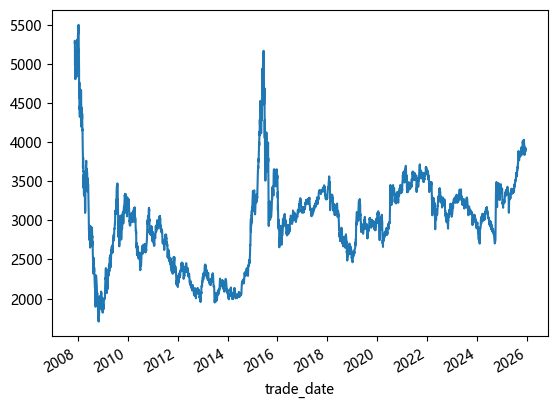

In [5]:
sse_index['20071118':]["close"].plot()

In [6]:
# 开始编程
performance_results = {}
# 提取一次收盘价序列，避免循环内重复索引

close = sse_index["close"]

for short_window in [10, 20, 50]:
    for long_window in [100, 150, 200]:
        print(f"short_window: {short_window}, long_window: {long_window}")
        # 调用策略函数
        sma = moving_average_strategy(close, short_window=short_window, long_window=long_window,start_date="2007-11-18")
        # 评估并记录结果
        performance_results[f"sma_{short_window}_{long_window}"] = strategy_evaluate(sma.get("strategy_log_returns"), plot=False)

# 将结果转换为DataFrame
performance_results_df = pd.DataFrame(performance_results)


short_window: 10, long_window: 100
short_window: 10, long_window: 150
short_window: 10, long_window: 200
short_window: 20, long_window: 100
short_window: 20, long_window: 150
short_window: 20, long_window: 200
short_window: 50, long_window: 100
short_window: 50, long_window: 150
short_window: 50, long_window: 200


In [7]:
performance_results_df.T

,annual_ret,annual_volitity,sharpe,max_dd
sma_10_100,0.014272,0.147428,-0.038852,-0.538293
sma_10_150,0.022532,0.148520,0.017050,-0.493360
sma_10_200,0.006607,0.151170,-0.088597,-0.528868
sma_20_100,0.028575,0.147648,0.058078,-0.521013
sma_20_150,0.026736,0.147915,0.045542,-0.475964
sma_20_200,0.010298,0.150838,-0.064322,-0.514779
sma_50_100,0.034499,0.150456,0.096365,-0.425780
sma_50_150,0.009730,0.151476,-0.067801,-0.575051
sma_50_200,0.001287,0.150580,-0.124274,-0.573201


参数选择：50-100组合是个不错的选择

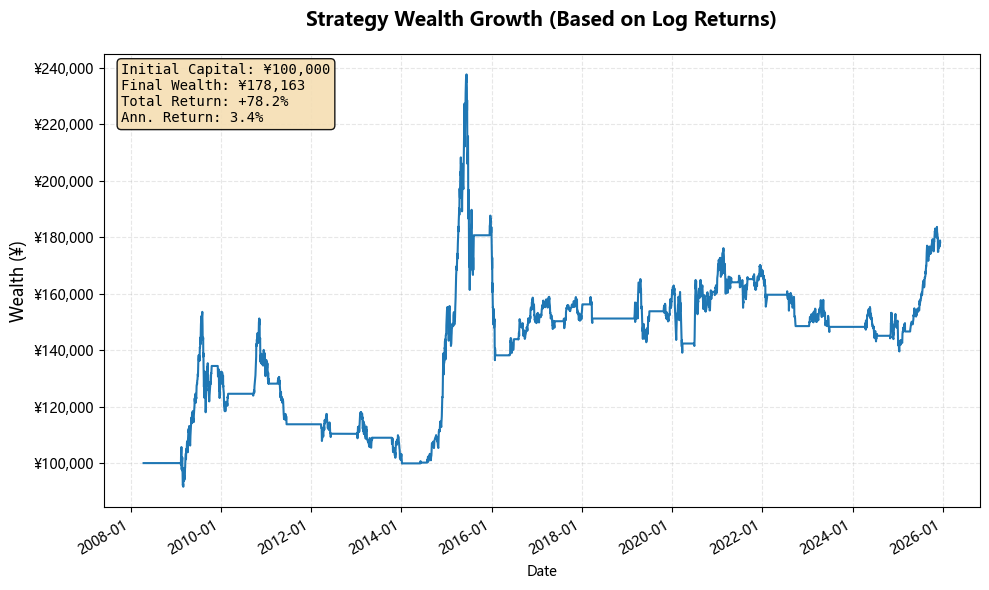

策略表现评估 (基于对数收益率)
年化收益率: 3.45%
年化波动率: 15.05%
夏普比率 (无风险利率2%): 0.10
最大回撤: -42.58%
最大回撤期: 2015-06-12 至 2016-01-28


In [8]:
# 调用策略函数
sma = moving_average_strategy(close, short_window=50, long_window=100,start_date="2007-11-18")
# 评估并记录结果
performance_results[f"sma_{short_window}_{long_window}"] = strategy_evaluate(sma.get("strategy_log_returns"), plot=True)

## 实验: 美国标普500指数相关的双均线策略评估

- 基于美国标普500指数做双均线策略
- 评估参数对策略的影响
- 评估策略的风险和收益
- 选取不同历史时期做策略评估

数据
- spx.csv

**邀请同学分享实验结果**

In [9]:
#开始编程
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from helper_function import strategy_evaluate,calculate_log_returns
# 读取数据
spx = pd.read_csv("spx.csv", index_col="trade_date", parse_dates=True)
spx.sort_index(inplace = True)
spx_close = spx["close"]
spx_close


trade_date
2000-01-03    1455.22
2000-01-04    1399.42
2000-01-05    1402.11
2000-01-06    1403.45
2000-01-07    1441.47
               ...   
2025-12-03    6849.72
2025-12-04    6857.12
2025-12-05    6870.40
2025-12-08    6846.51
2025-12-09    6840.51
Name: close, Length: 6523, dtype: float64

In [10]:
spx_log_ret = calculate_log_returns(spx_close)

C:\Users\Nanzheng\AppData\Local\Temp\ipykernel_53720\2881201493.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sma_log_ret_spx.dropna(inplace=True)


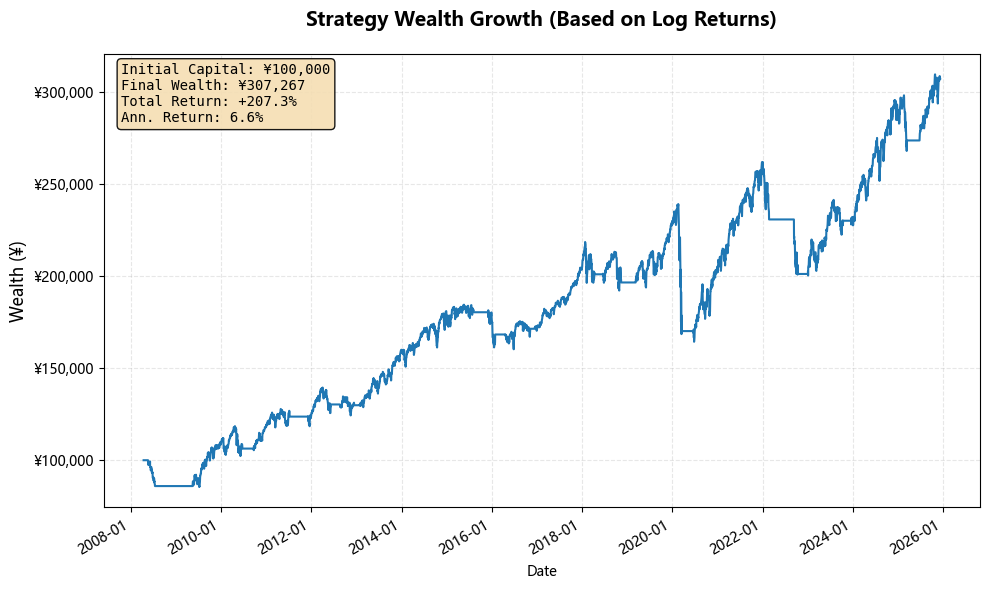

策略表现评估 (基于对数收益率)
年化收益率: 6.57%
年化波动率: 13.19%
夏普比率 (无风险利率2%): 0.35
最大回撤: -31.27%
最大回撤期: 2020-02-19 至 2020-06-26


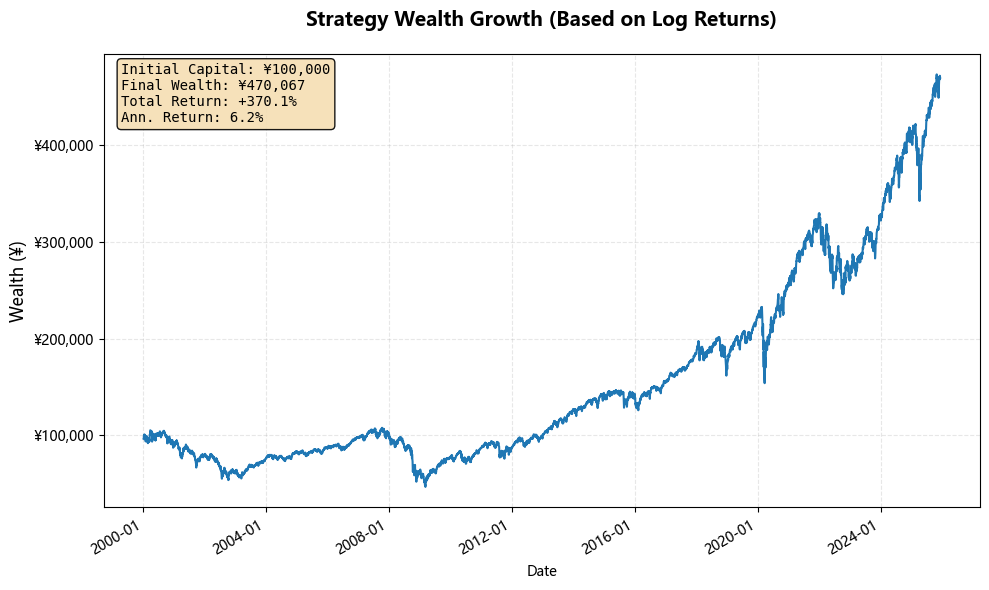

策略表现评估 (基于对数收益率)
年化收益率: 6.16%
年化波动率: 19.41%
夏普比率 (无风险利率2%): 0.21
最大回撤: -56.78%
最大回撤期: 2007-10-09 至 2009-03-09


In [11]:
# 计算对数收益率
spx_log_ret = calculate_log_returns(spx_close)
spx_log_ret.dropna(inplace=True)

sma_spx = moving_average_strategy(spx_close, short_window=50, long_window=100,start_date="2007-11-18")
sma_log_ret_spx = sma_spx.get("strategy_log_returns")
sma_log_ret_spx.dropna(inplace=True)

# 评估并记录结果
performance_results[f"spx_log_ret"] = strategy_evaluate(sma_log_ret_spx, plot=True)
# 评估buy and hold策略
performance_results[f"spx_buy_hold"] = strategy_evaluate(spx_log_ret, plot=True)

## 日历交易策略

**基于我们的课程作业结果，大家可以测试不同的时期的策略，评估基于月度的日历交易策略的性能**

思考
- 在中国股票市场（上证指数SSE）采用月度日历效应投资策略合适吗？

数据
- sse_index.csv

实验
- 根据月度效应（2010年之前）的月度效应，总结规律
- 根据你总结的规律，给出一个投资策略（选择一些月份持有多头，一些月份卖空，一些月份空仓）。
- 在2010年至今的数据集上测试并评估你的策略

基础知识：
- 对数收益率的计算公式是： log_return = np.log(close_t) - np.log(close_t-1) ，其中 close_t 是当前收盘价， close_t-1 是前一时期收盘价。
- 买多（持有多头）时，收益率 = 对数收益率
- 卖空（持有空头）时，收益率 = -对数收益率
当空仓用信号-1表示时，我们可以将信号直接乘以对数收益率得到卖空收益率： short_log_return = log_return * signal

C:\Users\Nanzheng\AppData\Local\Temp\ipykernel_53720\2595017204.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sse_index_from_2018["monthly_signal"] = monthly_signal


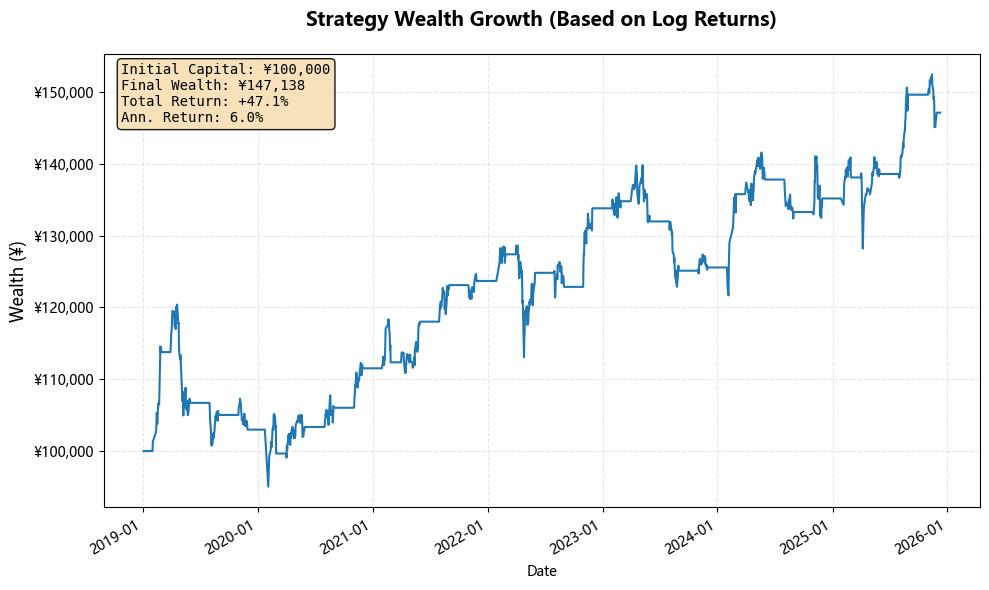

策略表现评估 (基于对数收益率)
年化收益率: 5.96%
年化波动率: 11.00%
夏普比率 (无风险利率2%): 0.36
最大回撤: -21.08%
最大回撤期: 2019-04-19 至 2020-02-03


{'annual_ret': np.float64(0.05956784446602059),
 'annual_volitity': np.float64(0.10996206252749495),
 'sharpe': np.float64(0.35983177794729915),
 'max_dd': -0.21080863850995638}

In [12]:
# 开始编程
# 新增一个持有月份singal, 2,3,4,5,11月
sse_index_from_2018 = sse_index["20190101":]
monthly_signal = (sse_index_from_2018.index.month.isin([2,4,5,8,11]))
monthly_signal = monthly_signal.astype(int)
sse_index_from_2018["monthly_signal"] = monthly_signal
# sse log returns
sse_index_log_returns = calculate_log_returns(sse_index_from_2018["close"])
sse_index_log_returns.dropna(inplace=True)
# 计算策略log returns
monthly_signal_log_returns = sse_index_from_2018["monthly_signal"]* sse_index_log_returns
monthly_signal_log_returns.dropna(inplace=True)
# 评估策略
strategy_evaluate(monthly_signal_log_returns)

# 预测任务

## Stock market one-day ahead movement prediction

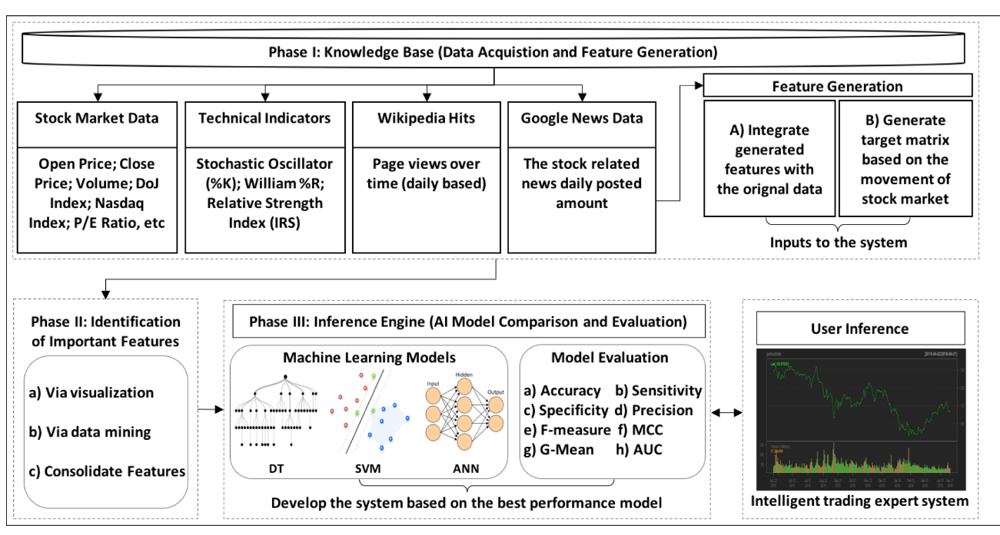

## 文本分类

我们经常被垃圾邮件困扰，如下图所示：

<img src="../img/spam.png" align='left' height="500" width="600"/>

如何做垃圾邮件过滤器呢？

<img src="../img/rulebased.png" align='left' height="300" width="400"/>

* 步骤1：首先看看垃圾邮件通常是什么样子。你可能会注意到一些单词或短语(如“邀请函”、“培训班”、“offer”和“important information”)在垃圾邮件中经常出现。
* 步骤2：您可以为每个模式编写一个检测算法，如果检测到许多这样的模式，您的程序将把电子邮件标记为垃圾邮件。
* 步骤3：测试您的程序，并重复步骤1和步骤2，直到足够好为止。

由于这个这些规则不太明显，您的程序很可能会变成一长串复杂的规则——很难维护。

相比之下，基于机器学习技术的垃圾邮件过滤器，则通过检测垃圾邮件示例中与非垃圾邮件示例相比出现的异常的单词模式，自动学习哪些单词和短语是垃圾邮件的**良好预测特征**（例如提高“邀请函”、“培训班”、“offer”和“important information”等词汇的权重）。这样，程序要短得多，易于维护。

<img src="../img/mlbased.png" align='left' height="300" width="400"/>

传统的文本分类模型：
- 朴素贝叶斯模型

目前大模型能够较好处理文本分类任务

# 机器学习

Machine Learning is the science (and art) of programming computers so they can learn from data
More engineering-oriented one
A computer program is said to learn from experience E with respect to some task T and some performance measure P, if its performance on T, as measured by P, improves with experience E. 
* Task
* Experience
* Performance

## 有监督的机器学习：Supervised machine learning

机器学习任务有多种类型，这里我们重点提：有监督的机器学习和无监督的机器学习。在有监督学习中，训练数据有标签。一个典型的监督学习任务是分类。例如，我们可以通过带有标签（垃圾邮件还是正常邮件）的电子邮件，训练一个垃圾邮件过滤器。

<img src="../img/supervised.png" align='left' height="300" width="400"/>

### 分类任务

sentiment analysis
text 
- 这个电影很好看。
- 这个电影太糟糕了。

labels - positive or negative

### 回归任务

另一个典型的有监督学习任务是预测一个目标数值，例如汽车的价格，给定一组称为预测器的特性(里程、年龄、品牌等)。这类任务称为回归。

<img src="../img/regression.png" align='left' height="300" width="400"/>

监督学习的主要任务是学习一个模型，模型的一般形式为决策函数：$ Y = f(X)$或者条件概率分布$ P(Y|X)$。监督学习又可以分为生成方法和判别方法。
* 生成方法：由数据学习联合概率分布$P(X,Y)$,然后求出条件概率分布$P(Y|X)$作为预测的模型。$ P(A \mid B) = \frac{ P(B \mid A) P(A) }{P(B)}$ 

隐马尔科夫模型也是一类生成模型，其中的解码问题是典型的预测问题

* 判别方法：由数据直接学习决策函数$f(x)$作为预测的模型。代表方法：感知机，支持向量机，神经网络。

<img src="../img/supervised_learning.png" align='left' height="300" width="400"/>

## 无监督学习：Unsupervised learning 

无监督学习：在无监督学习中，训练数据是没有标记的。典型的应用包括：聚类、异常检测和新颖性检测、可视化和降维、关联规则学习

下面是一个t-SNE可视化的例子

<img src="../img/tsne.png" align='left' height="400" width="600"/>

## 强化学习

强化学习的典型框架：智能体在环境中采取一种行为，环境将其转换为一次回报和一种状态表示，随后反馈给智能体。

[强化学习](https://zh.wikipedia.org/wiki/%E5%BC%BA%E5%8C%96%E5%AD%A6%E4%B9%A0)

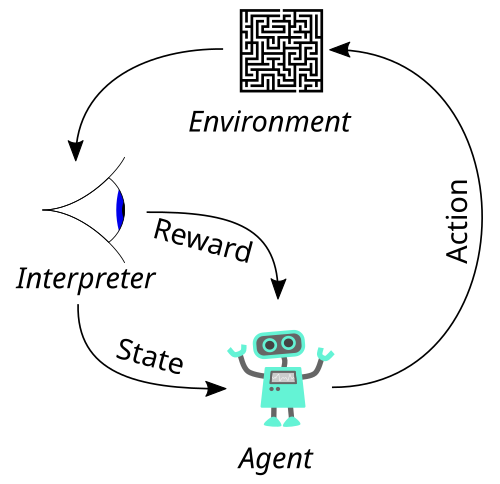

# 从经验学习得到模型：机器学习

## 模型是什么样子

### 非参数模型

KNN：
- 用于分类和回归的**非参数统计方法**
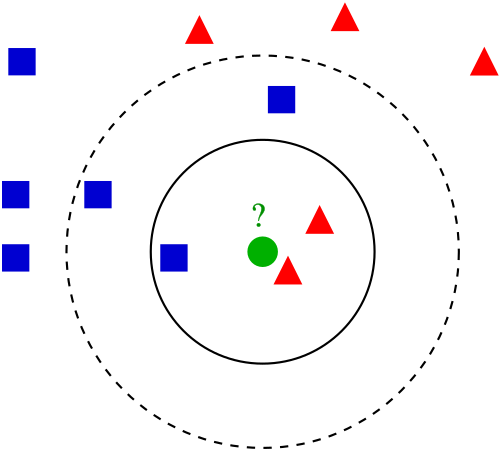

决策树
- 一种非参数监督学习方法，用于分类和回归

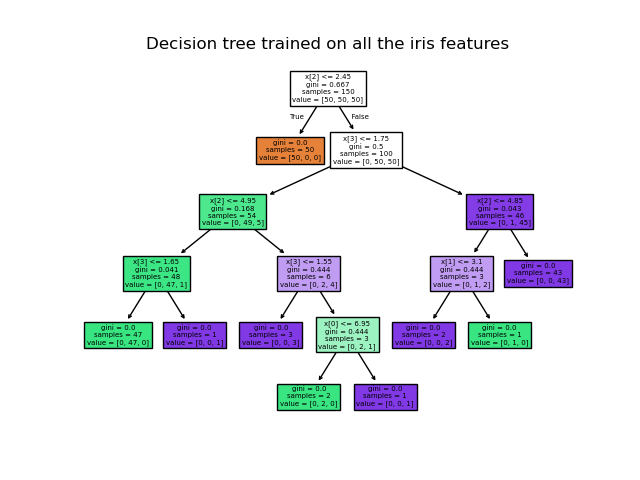

###  线性模型

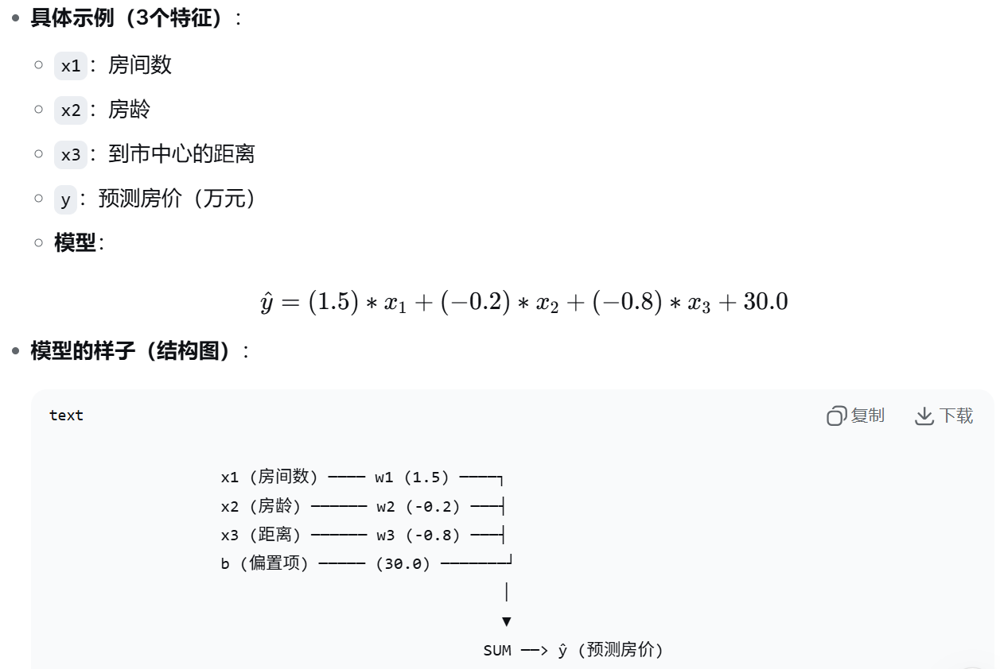

### 非线性模型

- 神经网络
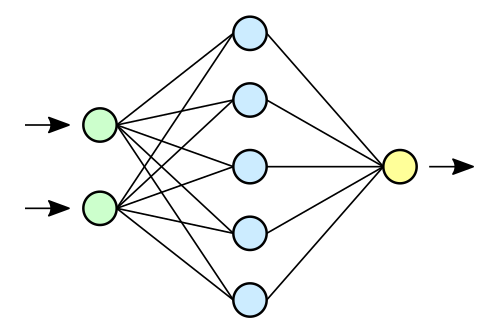

- 其中一个神经元的计算过程

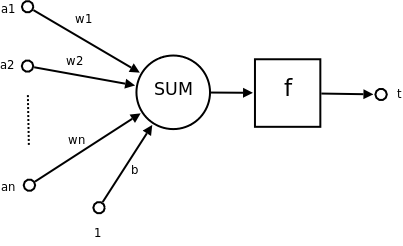

- 一个神经元的工作细节（举例）
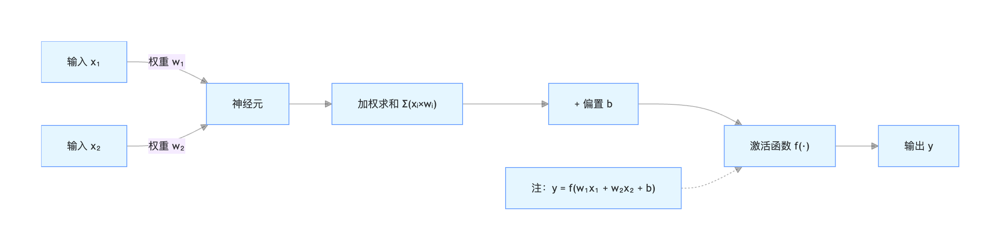

## 机器学习过程

Machine learning ≈constructs a mapping function

<img src="../img/mapping_function.png" align='left' height="400" width="600"/>

give some training samples $(x_i, y_i)$,1 ≤ i ≤ N, where $x_i$  is the input, and  $y_i$  is the target, let the computer automatically find a mapping function $f(·)$ to establish the relationship between $x$ and $y$.

<img src="../img/training.png" align='left' height="400" width="600"/>

Three elements of machine learning

<img src="../img/elements_ml.png" align='left' height="400" width="600"/>

Parameters learning (training models)

<img src="../img/parameter_learning.png" align='left' height="400" width="600"/>

# KNN分类模型

从非参数的KNN模型开始接触机器学习模型

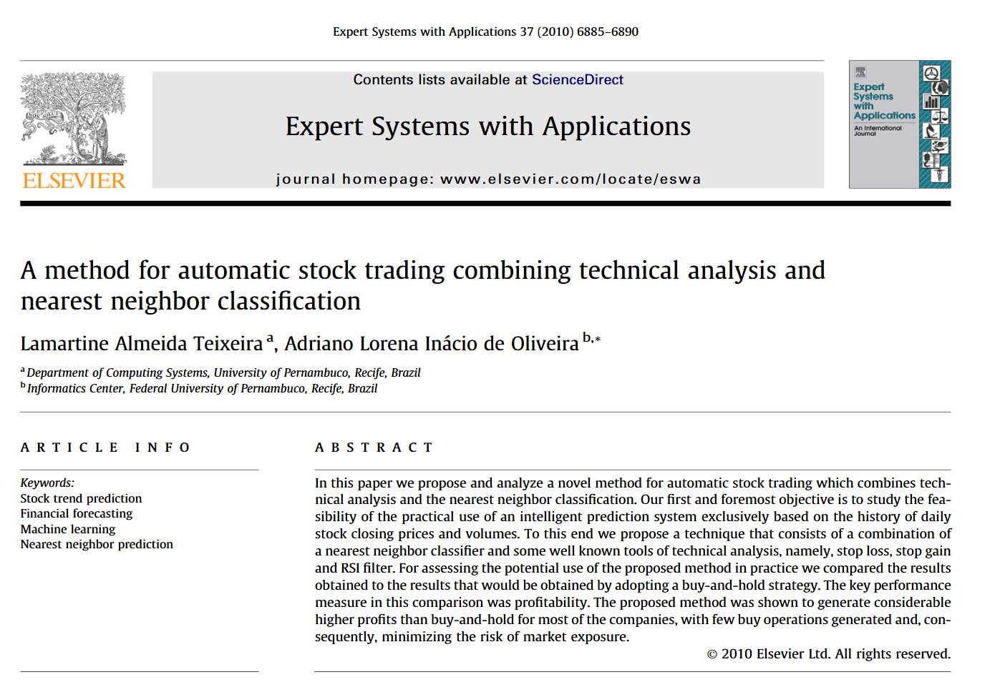

## 从植物分类来认识KNN

鸢尾花是一种美丽的花卉，属于鸢尾科多年生草本植物。它的名字源自希腊神话中的彩虹女神伊里斯，象征着希望和信仰。鸢尾花的花瓣通常有六枚，外轮常常反折，颜色丰富多样，常见的有蓝色和紫色。鸢尾花在中国文化中代表着恋爱与祝愿，历史悠久，深受人们喜爱。

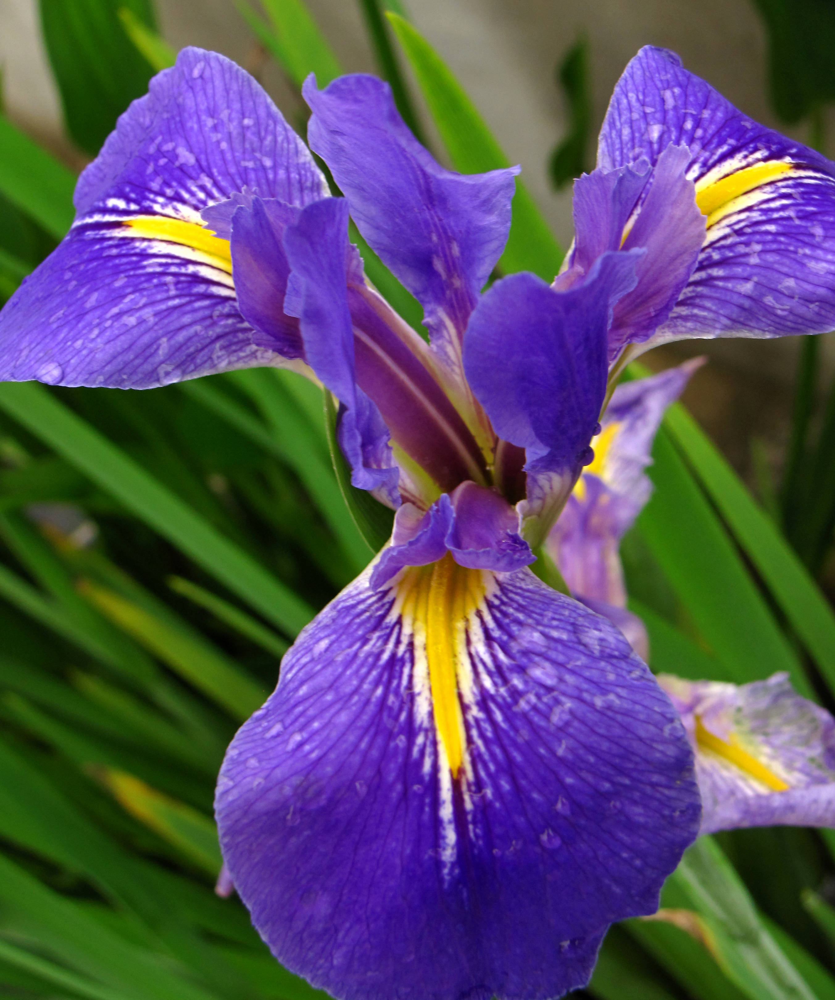

## 准备数据

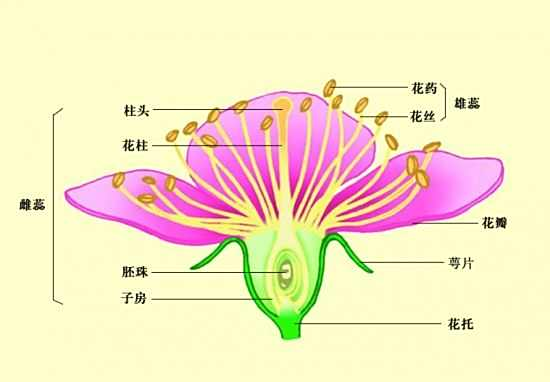

In [13]:
# 1. 导入必要的库
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns

In [14]:
from sklearn import datasets

In [15]:
# 设置中文字体和图表样式
plt.rcParams['font.sans-serif'] = ['SimHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False
plt.style.use('seaborn-v0_8-darkgrid')

In [16]:
# 加载鸢尾花数据集
iris = datasets.load_iris()
X = iris.data  # 特征：花萼长度、花萼宽度、花瓣长度、花瓣宽度
y = iris.target  # 标签：0=山鸢尾, 1=变色鸢尾, 2=维吉尼亚鸢尾
feature_names = iris.feature_names
target_names = iris.target_names

In [17]:
iris.data.shape

(150, 4)

In [18]:
X.shape

(150, 4)

In [19]:
y.shape

(150,)

In [20]:
feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

- **思考：在财经方面，上市公司有哪些特征**

## 数据探索


选择的可视化特征:
X轴: sepal width (cm)
Y轴: petal width (cm)


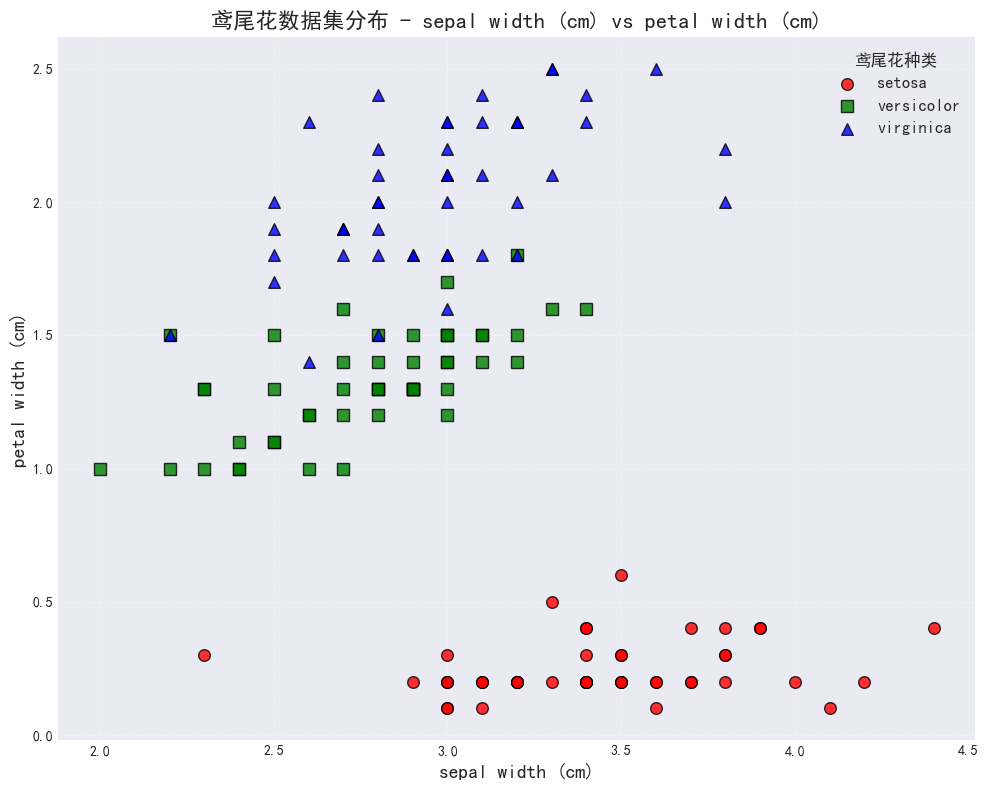

In [21]:
# 设置中文字体
plt.rcParams['font.sans-serif'] = ['SimHei', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# 选择要可视化的两个特征维度
# 这里选择花瓣长度(第3个特征，索引2)和花瓣宽度(第4个特征，索引3)
# 这两个特征通常最能区分鸢尾花种类
feature1_idx, feature2_idx = 1, 3
feature1_name = feature_names[feature1_idx]
feature2_name = feature_names[feature2_idx]

print(f"\n选择的可视化特征:")
print(f"X轴: {feature1_name}")
print(f"Y轴: {feature2_name}")

# 创建散点图
plt.figure(figsize=(10, 8))

# 为每个类别设置不同的颜色和标记
colors = ['red', 'green', 'blue']
markers = ['o', 's', '^']

# 绘制每个类别的散点图
for i, (class_name, color, marker) in enumerate(zip(target_names, colors, markers)):
    plt.scatter(X[y == i, feature1_idx],  # 特征1的值
                X[y == i, feature2_idx],  # 特征2的值
                c=color, 
                marker=marker,
                label=class_name,
                edgecolor='black',
                s=70,  # 点的大小
                alpha=0.8)

# 添加图表标题和坐标轴标签
plt.title(f'鸢尾花数据集分布 - {feature1_name} vs {feature2_name}', fontsize=16, fontweight='bold')
plt.xlabel(feature1_name, fontsize=14)
plt.ylabel(feature2_name, fontsize=14)

# 添加图例
plt.legend(title='鸢尾花种类', fontsize=12, title_fontsize=12)

# 添加网格线
plt.grid(True, alpha=0.3, linestyle='--')

# 调整图表布局
plt.tight_layout()

# 显示图表
plt.show()

## 划分训练集和测试集

In [22]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)
print(f"训练集大小: {X_train.shape[0]} 个样本")
print(f"测试集大小: {X_test.shape[0]} 个样本")

训练集大小: 105 个样本
测试集大小: 45 个样本


## 特征做标准化处理

**数据标准化绝对不能分别对训练集和测试集单独做！**

**正确做法：使用训练集的参数标准化所有数据**

StandardScaler 标准化公式

对于每个特征，标准化转换公式为：

$$
z = \frac{x - \mu}{\sigma}
$$

其中：
- $z$：标准化后的特征值
- $x$：原始特征值
- $\mu$：特征均值
- $\sigma$：特征标准差

- 均值计算

$$
\mu = \frac{1}{n} \sum_{i=1}^{n} x_i
$$

- 标准差计算

$$
\sigma = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (x_i - \mu)^2}
$$

In [23]:
# 特征标准化（KNN对特征尺度敏感）
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## 模型训练

In [24]:
# 创建KNN分类器
knn = KNeighborsClassifier(n_neighbors=5, metric='euclidean') # 这里使用欧氏距离euclidean，也可以考虑使用cosine
knn.fit(X_train_scaled, y_train)

print(f"KNN模型参数: k={knn.n_neighbors}, 距离度量={knn.metric}")

KNN模型参数: k=5, 距离度量=euclidean


##  模型评估

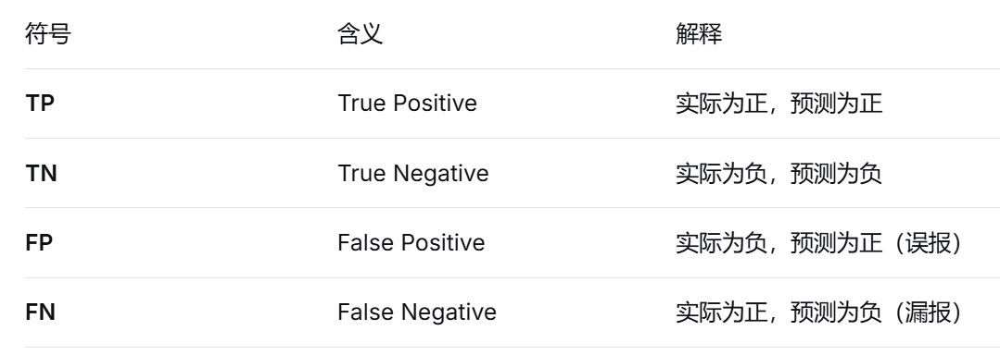

- 准确率
$$
\text{Accuracy} = \frac{TP + TN}{TP + TN + FP + FN}
$$

- 精确率
$$
\text{Precision} = \frac{TP}{TP + FP}
$$

- 召回率
$$
\text{Recall} = \frac{TP}{TP + FN}
$$

- F1分数
$$
F_1 = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}
$$

**不同的场景对准确率和召回率有不同的要求**

In [25]:
# 在训练集和测试集上的预测
y_train_pred = knn.predict(X_train_scaled)
y_test_pred = knn.predict(X_test_scaled)

In [26]:
# 计算准确率
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"训练集准确率: {train_accuracy:.4f}")
print(f"测试集准确率: {test_accuracy:.4f}")

训练集准确率: 0.9810
测试集准确率: 0.9111


In [27]:
# 分类报告
print("\n分类报告（测试集）:")
print(classification_report(y_test, y_test_pred, target_names=target_names))

# 混淆矩阵
cm = confusion_matrix(y_test, y_test_pred)
print("混淆矩阵:")
print(cm)


分类报告（测试集）:
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        15
  versicolor       0.79      1.00      0.88        15
   virginica       1.00      0.73      0.85        15

    accuracy                           0.91        45
   macro avg       0.93      0.91      0.91        45
weighted avg       0.93      0.91      0.91        45

混淆矩阵:
[[15  0  0]
 [ 0 15  0]
 [ 0  4 11]]


支持度 (Support)：支持度是指每个类别在测试集中的真实样本数量。

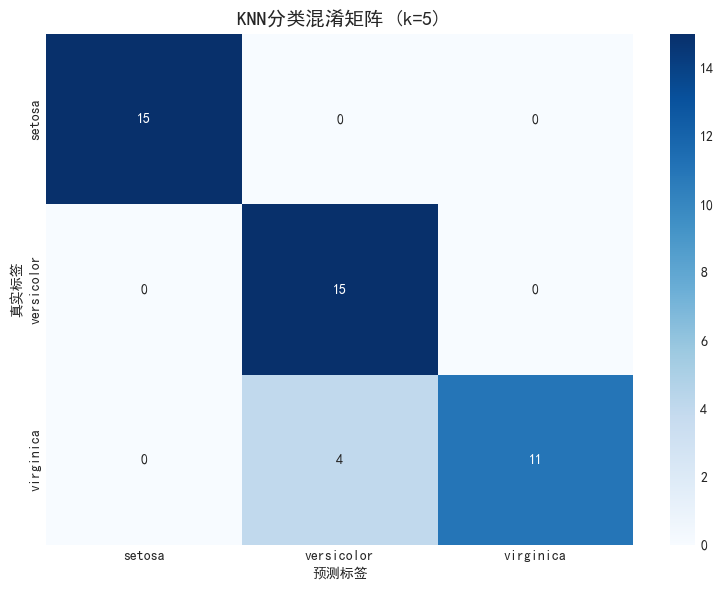

In [28]:
# 可视化混淆矩阵
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=target_names, yticklabels=target_names)
plt.title('KNN分类混淆矩阵 (k=5)', fontsize=14)
plt.xlabel('预测标签')
plt.ylabel('真实标签')
plt.tight_layout()
plt.show()

##  K值选择实验
- 什么样的超参数K才是合适的？

In [29]:
# 测试不同的K值
k_values = range(1, 21)
train_accuracies = []
test_accuracies = []

for k in k_values:
    # 创建并训练模型
    knn_temp = KNeighborsClassifier(n_neighbors=k, metric='euclidean')
    knn_temp.fit(X_train_scaled, y_train)
    
    # 计算准确率
    train_accuracies.append(knn_temp.score(X_train_scaled, y_train))
    test_accuracies.append(knn_temp.score(X_test_scaled, y_test))
    
    # 显示当前K值的准确率
    if k in [1, 3, 5, 10, 15, 20]:
        print(f"K={k:2d}: 训练集准确率={train_accuracies[-1]:.4f}, 测试集准确率={test_accuracies[-1]:.4f}")

K= 1: 训练集准确率=1.0000, 测试集准确率=0.9333
K= 3: 训练集准确率=0.9714, 测试集准确率=0.9111
K= 5: 训练集准确率=0.9810, 测试集准确率=0.9111
K=10: 训练集准确率=0.9810, 测试集准确率=0.9333
K=15: 训练集准确率=0.9810, 测试集准确率=0.9333
K=20: 训练集准确率=0.9619, 测试集准确率=0.8889


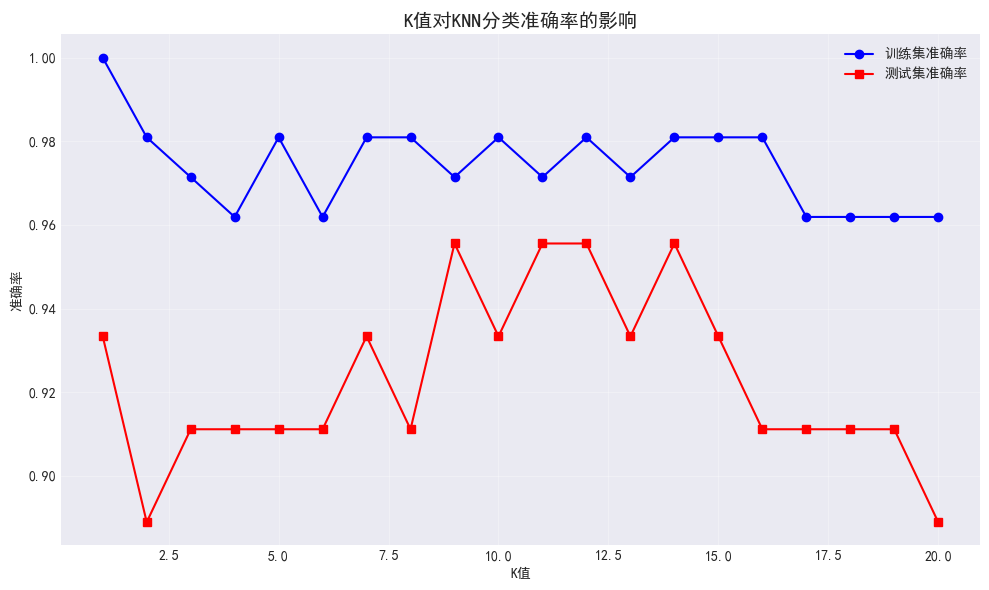

In [30]:
# 可视化K值对准确率的影响
plt.figure(figsize=(10, 6))
plt.plot(k_values, train_accuracies, 'b-', label='训练集准确率', marker='o')
plt.plot(k_values, test_accuracies, 'r-', label='测试集准确率', marker='s')
plt.xlabel('K值')
plt.ylabel('准确率')
plt.title('K值对KNN分类准确率的影响', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [31]:
# 找到最佳K值
best_k = k_values[np.argmax(test_accuracies)]
print(f"\n最佳K值: {best_k} (测试集准确率: {test_accuracies[best_k-1]:.4f})")


最佳K值: 9 (测试集准确率: 0.9556)


## 使用最佳K值重新训练模型

In [32]:
knn_best = KNeighborsClassifier(n_neighbors=best_k, metric='euclidean')
knn_best.fit(X_train_scaled, y_train)

y_test_pred_best = knn_best.predict(X_test_scaled)
test_accuracy_best = accuracy_score(y_test, y_test_pred_best)

print(f"优化后的测试集准确率: {test_accuracy_best:.4f}")

优化后的测试集准确率: 0.9556


## 模型预测示例

In [33]:
# 创建一些新样本进行预测
new_samples = np.array([
    [5.1, 3.5, 1.4, 0.2],  # 类似山鸢尾
    [6.0, 2.9, 4.5, 1.5],  # 类似变色鸢尾
    [7.2, 3.0, 5.8, 2.1]   # 类似维吉尼亚鸢尾
])

# 标准化新样本
new_samples_scaled = scaler.transform(new_samples)

# 进行预测
predictions = knn_best.predict(new_samples_scaled)
probabilities = knn_best.predict_proba(new_samples_scaled)

在KNN中，predict_proba()方法返回的"概率"并不是传统统计模型中的概率，而是基于最近邻投票的平滑频率估计。

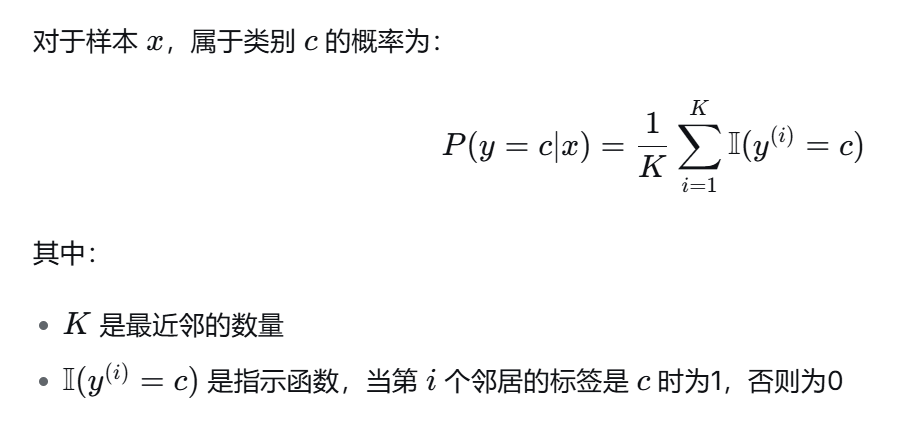

In [34]:
print("新样本预测结果:")
for i, (sample, pred, prob) in enumerate(zip(new_samples, predictions, probabilities)):
    print(f"样本{i+1}: 特征={sample}")
    print(f"  预测类别: {target_names[pred]}")
    print(f"  类别概率: 山鸢尾={prob[0]:.4f}, 变色鸢尾={prob[1]:.4f}, 维吉尼亚鸢尾={prob[2]:.4f}")
    print()

新样本预测结果:
样本1: 特征=[5.1 3.5 1.4 0.2]
  预测类别: setosa
  类别概率: 山鸢尾=1.0000, 变色鸢尾=0.0000, 维吉尼亚鸢尾=0.0000

样本2: 特征=[6.  2.9 4.5 1.5]
  预测类别: versicolor
  类别概率: 山鸢尾=0.0000, 变色鸢尾=0.8889, 维吉尼亚鸢尾=0.1111

样本3: 特征=[7.2 3.  5.8 2.1]
  预测类别: virginica
  类别概率: 山鸢尾=0.0000, 变色鸢尾=0.0000, 维吉尼亚鸢尾=1.0000



# 应用KNN做股价波动预测

- 基于浦发银行的技术因子：RSI、KDJ、MA等技术指标，也称为features，真实的target(y)是当前天的收盘价是否大于上一个交易日收盘价，如果大于等于：1，否则是-1。数据保存在index_sse.csv。
- 参考鸢尾花KNN示例，写一个基于技术因子来做上证指数下一个交易日涨跌预测的机器学习模型: 包括数据预处理准备、数据要分为训练集、测试集、回测数据集、模型训练、模型评估、K值选择、模型使用、回测。

## 数据采集

In [35]:
import tushare as ts
# 为了批改方便，我这里将tushare token直接放到代码中
token = "d60077d056be2a4e38f3c75c18ba317cb41ae04bf734b259ee08fcb6"
ts.set_token(token=token)
pro = ts.pro_api()

In [36]:
pro = ts.pro_api()

df = pro.stk_factor_pro(ts_code='600000.SH', start_date='20000101', end_date='20251216')

In [37]:
for i in list(df.columns):
      print(i)

ts_code
trade_date
open
open_hfq
open_qfq
high
high_hfq
high_qfq
low
low_hfq
low_qfq
close
close_hfq
close_qfq
pre_close
change
pct_chg
vol
amount
turnover_rate
turnover_rate_f
volume_ratio
pe
pe_ttm
pb
ps
ps_ttm
dv_ratio
dv_ttm
total_share
float_share
free_share
total_mv
circ_mv
adj_factor
asi_bfq
asi_hfq
asi_qfq
asit_bfq
asit_hfq
asit_qfq
atr_bfq
atr_hfq
atr_qfq
bbi_bfq
bbi_hfq
bbi_qfq
bias1_bfq
bias1_hfq
bias1_qfq
bias2_bfq
bias2_hfq
bias2_qfq
bias3_bfq
bias3_hfq
bias3_qfq
boll_lower_bfq
boll_lower_hfq
boll_lower_qfq
boll_mid_bfq
boll_mid_hfq
boll_mid_qfq
boll_upper_bfq
boll_upper_hfq
boll_upper_qfq
brar_ar_bfq
brar_ar_hfq
brar_ar_qfq
brar_br_bfq
brar_br_hfq
brar_br_qfq
cci_bfq
cci_hfq
cci_qfq
cr_bfq
cr_hfq
cr_qfq
dfma_dif_bfq
dfma_dif_hfq
dfma_dif_qfq
dfma_difma_bfq
dfma_difma_hfq
dfma_difma_qfq
dmi_adx_bfq
dmi_adx_hfq
dmi_adx_qfq
dmi_adxr_bfq
dmi_adxr_hfq
dmi_adxr_qfq
dmi_mdi_bfq
dmi_mdi_hfq
dmi_mdi_qfq
dmi_pdi_bfq
dmi_pdi_hfq
dmi_pdi_qfq
downdays
updays
dpo_bfq
dpo_hfq
dpo_qfq
ma

In [38]:
df.to_csv("600000sh.csv")

## 数据预处理

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [41]:
data

,ts_code,open,open_hfq,open_qfq,high,high_hfq,high_qfq,low,low_hfq,low_qfq,...,xsii_td2_bfq,xsii_td2_hfq,xsii_td2_qfq,xsii_td3_bfq,xsii_td3_hfq,xsii_td3_qfq,xsii_td4_bfq,xsii_td4_hfq,xsii_td4_qfq,up_down
trade_date,,,,,,,,,,,,,,,,,,,,,
2001-01-02,600000.SH,20.75,20.89525,1.25924,21.00,21.14700,1.27441,20.60,20.74420,1.25014,...,20.29678,20.43886,1.23174,23.52897,23.67270,1.42662,20.45041,20.57534,1.23996,-1.0
2001-01-03,600000.SH,20.92,21.06644,1.26956,20.96,21.10672,1.27199,20.71,20.85497,1.25682,...,20.33402,20.47636,1.23400,23.50241,23.64640,1.42504,20.42733,20.55248,1.23859,-1.0
2001-01-04,600000.SH,20.82,20.96574,1.26349,20.84,20.98588,1.26470,20.60,20.74420,1.25014,...,20.33108,20.47340,1.23382,23.46665,23.61091,1.42290,20.39625,20.52164,1.23673,-1.0
2001-01-05,600000.SH,20.65,20.79455,1.25317,20.70,20.84490,1.25621,20.28,20.42196,1.23072,...,20.29580,20.43787,1.23168,23.40955,23.55410,1.41948,20.34661,20.47225,1.23375,-1.0
2001-01-08,600000.SH,20.36,20.50252,1.23558,20.36,20.50252,1.23558,19.85,19.98895,1.20463,...,20.14782,20.28885,1.22270,23.29877,23.44354,1.41281,20.25033,20.37616,1.22796,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-12-09,600000.SH,11.41,189.33184,11.41000,11.43,189.66371,11.43000,11.31,187.67249,11.31000,...,11.08282,183.90277,11.08282,12.82647,212.63870,12.81458,11.14824,184.81681,11.13790,-1.0
2025-12-10,600000.SH,11.32,187.83842,11.32000,11.33,188.00436,11.33000,11.14,184.85159,11.14000,...,11.06469,183.60193,11.06469,12.81248,212.41020,12.80081,11.13608,184.61822,11.12594,1.0
2025-12-11,600000.SH,11.30,187.50655,11.30000,11.45,189.99558,11.45000,11.22,186.17907,11.22000,...,11.09262,184.06539,11.09262,12.80894,212.35263,12.79734,11.13300,184.56817,11.12292,1.0


In [40]:
# Step 1: Read the CSV file
print("Reading CSV file...")
file_path = "600000sh.csv"
data = pd.read_csv(file_path, index_col="trade_date", parse_dates=['trade_date'])

# Step 2: Preprocess the data
print("\nPreprocessing data...")
# Sort by trade_date to ensure chronological order
data = data.sort_index()
# Drop the 'Unnamed: 0' column
data.drop("Unnamed: 0", axis=1, inplace=True)
# Drop NA values
data.dropna(inplace=True)

# Step 3: Create target variable
print("\nCreating target variable...")
data['up_down'] = np.where(data['pct_chg'] >= 0, 1, -1)
data['up_down'] = data['up_down'].shift(-1)

# Drop the last row since it will have NaN after shift
data = data[:-1]

print("Target variable distribution:")
print(data['up_down'].value_counts())


Reading CSV file...

Preprocessing data...

Creating target variable...
Target variable distribution:
up_down
 1.0    2823
-1.0    2676
Name: count, dtype: int64


## 拆分数据集为训练集、测试集和回测数据集

In [42]:
data.index

DatetimeIndex(['2001-01-02', '2001-01-03', '2001-01-04', '2001-01-05',
               '2001-01-08', '2001-01-09', '2001-01-10', '2001-01-11',
               '2001-01-12', '2001-01-15',
               ...
               '2025-12-02', '2025-12-03', '2025-12-04', '2025-12-05',
               '2025-12-08', '2025-12-09', '2025-12-10', '2025-12-11',
               '2025-12-12', '2025-12-15'],
              dtype='datetime64[ns]', name='trade_date', length=5499, freq=None)

- 训练集：2000 - 2015
- 测试集：2016 - 2021
- 回测数据集：2022 - 2025

In [43]:
# Step 4: Split data into training, testing, and backtesting sets
print("\nSplitting data into training/testing/backtesting sets...")

# Extract year from trade_date
data['year'] = data.index.year

# Split data by years
train_data = data[(data['year'] >= 2000) & (data['year'] <= 2015)]
test_data = data[(data['year'] >= 2016) & (data['year'] <= 2021)]
backtest_data = data[(data['year'] >= 2022) & (data['year'] <= 2025)]

print(f"Training data shape (1999-2020): {train_data.shape}")
print(f"Testing data shape (2021-2023): {test_data.shape}")
print(f"Backtesting data shape (2024-2025): {backtest_data.shape}")


Splitting data into training/testing/backtesting sets...
Training data shape (1999-2020): (3161, 262)
Testing data shape (2021-2023): (1381, 262)
Backtesting data shape (2024-2025): (957, 262)


**我尝试了多种特征，最终给大家选择下面这个参数组合：比较简单的组合**

技术指标详解

1. `'pct_chg'` - 价格涨跌幅
- **经济含义**: 股票价格在特定周期内的百分比变化
- **计算公式**: `(今日收盘价 - 昨日收盘价) / 昨日收盘价 × 100%`
- **预测价值**: 
  - 反映市场情绪和动能
  - 正值表示上涨动能，负值表示下跌压力
  - 大幅波动可能预示趋势反转

2. `'macd_dif_hfq'` - MACD差离值（前复权）
- **经济含义**: 快速EMA与慢速EMA的差值，衡量趋势强度
- **计算**: `DIF = EMA12 - EMA26`
- **预测价值**:
  - DIF > 0: 上升趋势
  - DIF < 0: 下降趋势  
  - DIF穿越0轴是重要买卖信号
  - `hfq`表示前复权数据，确保连续性

3. `'rsi_hfq_12'` - 相对强弱指数（12日）
- **经济含义**: 测量价格变动的速度和变化幅度
- **取值范围**: 0-100
- **预测价值**:
  - RSI > 70: 超买状态，可能回调
  - RSI < 30: 超卖状态，可能反弹
  - 12周期比标准14周期更敏感

4. `'volume_ratio'` - 量比
- **经济含义**: 当日成交量与近期平均成交量的比值
- **计算**: `当日成交量 / 过去N日平均成交量`
- **预测价值**:
  - “> 1”: 成交量放大，关注度提升
  - < 1: 成交量萎缩，关注度下降
  - 量价配合是重要的确认信号

5. `'atr_hfq'` - 平均真实波幅（前复权）
- **经济含义**: 衡量价格波动率和市场不确定性
- **计算**: 基于最高价、最低价和收盘价的真实波幅平均值
- **预测价值**:
  - 高ATR: 高波动性，风险较大
  - 低ATR: 低波动性，趋势相对稳定


In [44]:
features = [
    'pct_chg',
    'macd_dif_hfq',
    'rsi_hfq_12', 
    'volume_ratio',
    'atr_hfq',
]

In [45]:
target = "up_down"

# Extract features and target into arrays for KNN modeling
print("\nExtracting features and target into arrays...")
X_train = train_data[features].values
y_train = train_data[target].values

X_test = test_data[features].values
y_test = test_data[target].values

X_backtest = backtest_data[features].values
y_backtest = backtest_data[target].values

print(f"X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape}, y_test shape: {y_test.shape}")
print(f"X_backtest shape: {X_backtest.shape}, y_backtest shape: {y_backtest.shape}")


Extracting features and target into arrays...
X_train shape: (3161, 5), y_train shape: (3161,)
X_test shape: (1381, 5), y_test shape: (1381,)
X_backtest shape: (957, 5), y_backtest shape: (957,)


## 特征标准化

In [46]:
# Step 4.1: Feature Standardization
print("\nPerforming feature standardization...")
scaler = StandardScaler()

# Fit the scaler on training data and transform all datasets
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_backtest_scaled = scaler.transform(X_backtest)

print(f"X_train_scaled shape: {X_train_scaled.shape}")
print(f"X_test_scaled shape: {X_test_scaled.shape}")
print(f"X_backtest_scaled shape: {X_backtest_scaled.shape}")


Performing feature standardization...
X_train_scaled shape: (3161, 5)
X_test_scaled shape: (1381, 5)
X_backtest_scaled shape: (957, 5)


## 模型训练 

In [47]:
# Step 4.2: Train KNN model
print("\nTraining KNN classifier...")
knn = KNeighborsClassifier(n_neighbors = 15) 
knn.fit(X_train_scaled, y_train)

print(f"KNN模型参数: k={knn.n_neighbors}, 距离度量={knn.metric}, 权重={knn.weights}")


Training KNN classifier...
KNN模型参数: k=15, 距离度量=minkowski, 权重=uniform


## 在测试集上评估参数选择

In [48]:

# Step 5.1: KNN Hyperparameter Tuning
print("\nKNN模型超参数调优")
knn_param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33, 35, 37, 39, 41, 43, 45, 47, 49, 51, 53, 55, 57, 59, 61, 63, 65, 67, 69, 71, 73, 75, 77, 79, 81, 83, 85, 87, 89, 91, 93, 95, 97, 99],
    'metric': ['euclidean', 'manhattan','cosine'],
    'weights': ['uniform', 'distance']
}

# 使用测试集选择最佳参数（不使用交叉验证）
best_accuracy = 0
best_knn_params = None
best_knn = None

from itertools import product

# 生成所有参数组合
param_combinations = list(product(
    knn_param_grid['n_neighbors'],
    knn_param_grid['metric'],
    knn_param_grid['weights']
))

print(f"开始在测试集上评估 {len(param_combinations)} 种参数组合...")

for n_neighbors, metric, weights in param_combinations:
    try:
        # 创建KNN模型
        knn = KNeighborsClassifier(
            n_neighbors=n_neighbors,
            metric=metric,
            weights=weights
        )
        
        # 在训练集上训练
        knn.fit(X_train_scaled, y_train)
        
        # 在测试集上评估
        y_test_pred = knn.predict(X_test_scaled)
        accuracy = accuracy_score(y_test, y_test_pred)
        
        # 更新最佳参数
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_knn_params = {
                'n_neighbors': n_neighbors,
                'metric': metric,
                'weights': weights
            }
            best_knn = knn
    except Exception as e:
        print(f"参数组合 ({n_neighbors}, {metric}, {weights}) 出错: {e}")
        continue

print(f"\n最佳KNN参数: {best_knn_params}")


KNN模型超参数调优
开始在测试集上评估 294 种参数组合...

最佳KNN参数: {'n_neighbors': 55, 'metric': 'cosine', 'weights': 'distance'}


weights='distance'
- 作用 : 定义邻居的投票权重
- 'distance' : 距离越近的邻居权重越大

## 模型评估

In [49]:
# Step 4.2: Train KNN model
print("\nTraining KNN classifier...")
knn = KNeighborsClassifier(n_neighbors = 55, metric='cosine', weights='distance') 
knn.fit(X_train_scaled, y_train)

print(f"KNN模型参数: k={knn.n_neighbors}, 距离度量={knn.metric}, 权重={knn.weights}")


Training KNN classifier...
KNN模型参数: k=55, 距离度量=cosine, 权重=distance



Evaluating KNN model on test and backtest datasets...

模型准确性:
测试集 (2021-2023) 准确率: 0.5235


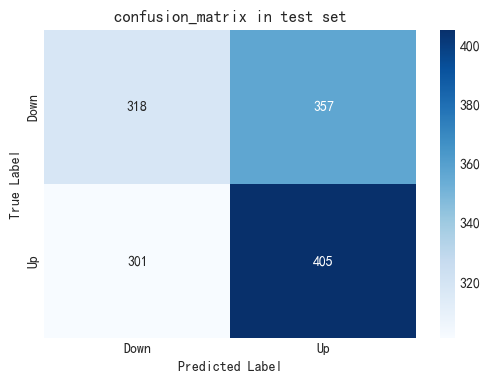


测试集分类报告:
              precision    recall  f1-score   support

        -1.0       0.51      0.47      0.49       675
         1.0       0.53      0.57      0.55       706

    accuracy                           0.52      1381
   macro avg       0.52      0.52      0.52      1381
weighted avg       0.52      0.52      0.52      1381



In [50]:
import seaborn as sns
# Step 4.3: Evaluate KNN model on test and backtest datasets
print("\nEvaluating KNN model on test and backtest datasets...")

# Make predictions
y_test_pred = knn.predict(X_test_scaled)

# Calculate accuracy
accuracy_test = accuracy_score(y_test, y_test_pred)

print(f"\n模型准确性:")
print(f"测试集 (2021-2023) 准确率: {accuracy_test:.4f}")

# Generate confusion matrices
cm_test = confusion_matrix(y_test, y_test_pred)

import matplotlib.pyplot as plt

# 绘制带标签的混淆矩阵
plt.figure(figsize=(6, 4))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
plt.title('confusion_matrix in test set')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Create classification reports
cr_test = classification_report(y_test, y_test_pred)

print(f"\n测试集分类报告:")
print(cr_test)


# 应用KNN模型做量化交易回测

## 准备评估函数

- 下面的评估函数和我们给出的helper function中的策略评估函数相似，大家可以自由选择使用

In [51]:
def max_drawdown(capital):
    """
    该函数计算最大回撤：财富的最大损失幅度
    capital：表示财富值，如果你已经计算出对数收益率为T，可以T.cumsum().apply(np.exp)计算累计财富值
    """
    # 转换为 numpy 数组以避免警告
    capital_array = capital.to_numpy() if hasattr(capital, 'to_numpy') else np.array(capital)
    
    max_capital = np.zeros(len(capital_array))
    drawdown = np.zeros(len(capital_array))
    max_drawdown_value = 0.0
    
    for i in range(1, len(capital_array)):
        max_capital[i] = max(max_capital[i-1], capital_array[i])
        if max_capital[i] > 0:
            drawdown[i] = (max_capital[i] - capital_array[i]) / max_capital[i]
        max_drawdown_value = max(max_drawdown_value, drawdown[i])
        
    return max_drawdown_value


# 设置函数：计算净值曲线的绩效指标
def get_Performance_analysis(T,year_day = 252):
    '''
    输入：T表示每日的收益率序列，每年的期数,我们默认是250个交易日
    
    输出：绩效指标
    '''

    # 计算年化收益率
    year_ret_mean = np.exp(T.dropna().mean() * year_day) - 1
    year_ret_mean = round(year_ret_mean*100,2)
    
    # 计算年化波动率
    volitiy = T.dropna().std()*np.sqrt(year_day)
    volitiy = round(volitiy*100,2)
    
    #计算夏普，无风险收益率记2%
    Sharpe = (year_ret_mean - 2)/volitiy
    Sharpe = round(Sharpe,2)

    # 计算最大回撤
    downlow = max_drawdown(T.cumsum().apply(np.exp))
    downlow = round(downlow*100,2)
    
    # 输出
    return [year_ret_mean,downlow,Sharpe,volitiy]

## 基于KNN模型的股票预测（回测数据集）

 <!-- # 例如，如果knn.classes_是[0, 1]，那么：
 #   y_proba[:, 0] 是类别0的概率
 #   y_proba[:, 1] 是类别1的概率 -->

In [52]:
backtest_data.close.shape

(957,)

In [53]:
X_backtest_scaled.shape

(957, 5)

In [55]:
y_pred = knn.predict(X_backtest_scaled)

df = pd.DataFrame()
df.index = backtest_data.index
df["y_pred"] = y_pred


# 根据条件生成交易信号
buy_condition = (df['y_pred'] == 1)
sell_condition = (df['y_pred'] == 0)

df.loc[buy_condition, 'signals'] = 1  # 生成购买信号1
df.loc[sell_condition, 'signals'] = -1  # 生成卖出信号-1

print(df.signals.value_counts())

signals
1.0    511
Name: count, dtype: int64


In [61]:
df

,y_pred,signals,position,close,return,strategy,trade_cost,strategy_with_tradecost
trade_date,,,,,,,,
2022-01-04,-1.0,NaN,0.0,8.57,NaN,NaN,0.0000,NaN
2022-01-05,1.0,1.0,0.0,8.64,0.008135,NaN,0.0001,NaN
2022-01-06,1.0,1.0,1.0,8.57,-0.008135,-0.008135,0.0001,-0.008235
2022-01-07,1.0,1.0,1.0,8.71,0.016204,0.016204,0.0001,0.016104
2022-01-10,1.0,1.0,1.0,8.72,0.001147,0.001147,0.0001,0.001047
...,...,...,...,...,...,...,...,...
2025-12-09,1.0,1.0,1.0,11.32,-0.006165,-0.006165,0.0001,-0.006265
2025-12-10,1.0,1.0,1.0,11.28,-0.003540,-0.003540,0.0001,-0.003640
2025-12-11,1.0,1.0,1.0,11.44,0.014085,0.014085,0.0001,0.013985


In [56]:
# 持有股票的仓位（1表示持有，0表示不持有），这个才是真正的盈利会亏损计算日期
df['position']=df['signals'].shift(1)
df['position'] = df['position'].fillna(0)

当前持仓乘以收益率，得到收益率：
```python
df["strategy"] = df["position"] * df["return"]
```

In [58]:
## 计算策略收益率
df["close"] = backtest_data.close
df["return"] = df["close"].apply(np.log).diff()
df["strategy"] = df["signals"].shift(1) * df["return"]  # 计算策略收益率




In [62]:
# 考虑交易成本
trade_cost = 0.0001
if trade_cost>0:
    df["trade_cost"] = 0.0
    df.loc[df['signals'].notna(), 'trade_cost'] = float(trade_cost)
    df["strategy_with_tradecost"] = df["strategy"] - df["trade_cost"]

<Axes: xlabel='trade_date'>

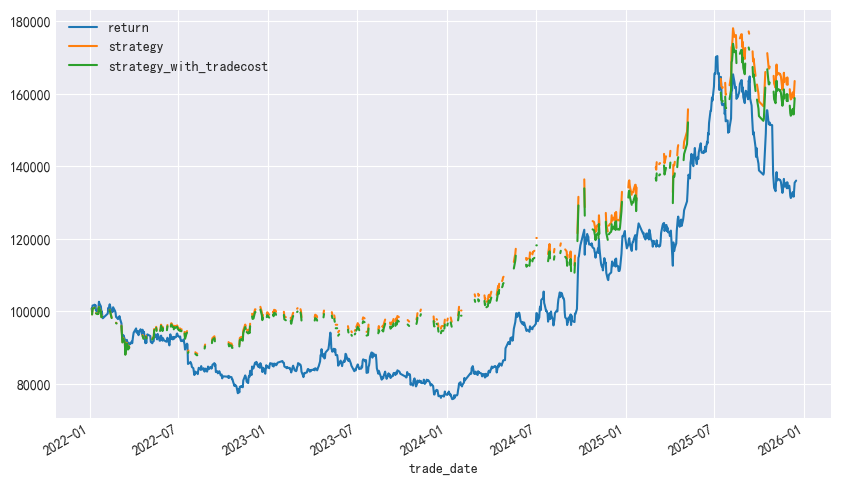

In [60]:
# 初始资金100000
initial_capital = 100000

# 将累计收益乘以初始资金，得到考虑初始投入的资产净值曲线
(df[["return","strategy","strategy_with_tradecost"]].cumsum().apply(np.exp) * initial_capital).plot(figsize=(10,6))

我们也可以使用strategy_evaluate函数来评估基于月度的日历交易策略的性能
- df["strategy"]

In [63]:
from helper_function import strategy_evaluate
# 使用strategy_evaluate函数来评估基于月度的日历交易策略的性能





In [64]:
from tabulate import tabulate
# 计算基准和策略的绩效指标
benchmark_performance = get_Performance_analysis(df["return"])
strategy_performance = get_Performance_analysis(df["strategy"])
# 考虑交易成本后的策略绩效指标
strategy_with_cost_performance = get_Performance_analysis(df["strategy_with_tradecost"])

# 将上述三种绩效指标合并为一个dataframe（行索引用投资策略，列名用评估指标）
performance_df = pd.DataFrame({
    "年化收益率(%)": [benchmark_performance[0], strategy_performance[0], strategy_with_cost_performance[0]],
    "最大回撤(%)": [benchmark_performance[1], strategy_performance[1], strategy_with_cost_performance[1]],
    "夏普比率": [benchmark_performance[2], strategy_performance[2], strategy_with_cost_performance[2]],
    "年化波动率(%)": [benchmark_performance[3], strategy_performance[3], strategy_with_cost_performance[3]]
}, index=["基准", "KNN策略", "考虑交易成本后的KNN策略"])
# 打印合并后的dataframe，使用 tabulate 对齐列宽
print("绩效对比表")
print(tabulate(performance_df, headers="keys", tablefmt="simple", colalign=("left",)))
print("-" * 50)

ModuleNotFoundError: No module named 'tabulate'

# 课后学习安排
- 参加财经预测比赛

特别声明：
- **该比赛的目标是提升大家做金融数据分析的能力，预测结果不作为投资依据**

## 参加财经预测比赛
- 注册名称：使用下面格式：真实姓名_学号。例如：郑海超_20110101
- 参加财经预测比赛
- 作业成绩按照预测能力（在本课程当前作业对应的比赛中的盈利）排名：第一名100分，名次下降1位递减1分，如果最终不满65分，按照65分计算。这个成绩不全部公布。这里的名次仅仅只在我们班级内部的排名。
- 排名信息我会从系统导出数据，大家先不用看页面上的排名

财经预测经验总结
- **每位同学都总结财经预测过程和经验,下节课分享交流**
- 做预测使用的数据
- 数据分析过程
- 写到WORD文档或者PPT

比赛奖励：
- 前3名确定有奖品
- 随机抽奖3个名额（前三名不重复获奖）

比赛注意事项：
- 比赛结束时间是：2025年12月23日 上午10点
- 比赛最终的结算时间：2025年12月24日上午，因为考虑美股比我们晚一天
- 比赛中的日期没有特别说明，是指北京时间。